# StarGAN v2 

Имплементация статьи [StarGAN v2: Diverse Image Synthesis for Multiple Domains](https://arxiv.org/abs/1912.01865). 

### Abstract

Предложенная модель решает задачу image-to-image переноса стиля от одного изображения к другому. Эта статья является продолжением идеи предложенной в оригинальной статье [StarGAN](https://arxiv.org/pdf/1711.09020), где решается проблема масштабируемости CycleGAN на несколько доменов. Проблема CycleGAN была в том, что для $k$ доменов требуется $k(k-1)$ генераторов, которые в целом избыточны и выучивают одни и те же признаки. 

В StarGAN генератор принимает на вход не только картинку, но и метку домена, что позволяет переносить изображение из одного домена в любой другой используя один генератор. Однако так как метка домена это фиксированный one-hot вектор, то модель выучивает детерминированное отображение из-за чего страдает разнообразие (diversity) сгенерированных изображений, хотя потенциально изображения из одного домена могут быть в разных стилях. 

Главное нововведение StarGANv2 это использование стилевого вектора (style-code) вместо метки домена. Стилевой вектор может генерироваться из гауссовского шума (MappingNetwork), а может извлекаться из референсного изображения (StyleEncoder). В результате модель опередила своих конкурентов в image-to-image задаче по качеству переноса стиля и разнообразия сгенерированных изображений.

Авторы использовали датасеты CelebA-HQ со знаменитостями и AFHQ с лицами животных. В этой имплементации я попробую обучить эту модель на более простом датасете CelebA.

### Requirements
Все необходимые библиотеки можно скачать используя команду 
```
pip install -r requirements.txt
```

# Dataset
В качестве данных использован датасет [CelebA](https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) c 200k лицами знаменитостей и их атрибутами. Датасет разделен на два даталоадера: оригинальный и референсный. Из референсного извлекается стиль. Далее стиль переносится на оригинальное изображение во время генерации.

In [1]:
from config import build_args
from dataloader import build_dataset, get_train_loader

args = build_args()

dataset, dataset_ref = build_dataset(args)
loader = get_train_loader(dataset, args)
loader_ref = get_train_loader(dataset_ref, args)

In [59]:
obj = next(iter(loader))
print(obj[0].shape)
print(obj[1].shape)

torch.Size([8, 3, 256, 256])
torch.Size([8])


In [6]:
def denormalize(image):
    mean = np.array([0.485, 0.456, 0.406])  # precomputed for CelebA
    std = np.array([0.229, 0.224, 0.225])
    image = image * std + mean
    return image.clip(0, 1)

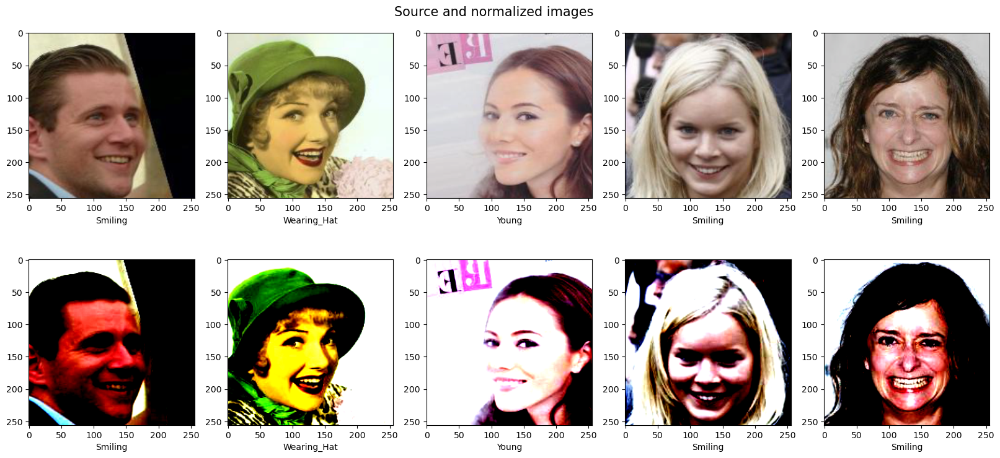

In [7]:
import matplotlib.pyplot as plt
import numpy as np

images_cnt = 5
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
plt.suptitle("Source and normalized images", fontsize=15)
fig.subplots_adjust(top=0.95)

for i, img_idx in enumerate(np.random.choice(range(len(dataset)), images_cnt)):
    img, target = dataset[img_idx]
    axes[0, i].imshow(denormalize(img.detach().cpu().numpy().transpose(1, 2, 0)))
    axes[0, i].set_xlabel(dataset.header[target])
    axes[1, i].imshow(img.detach().cpu().numpy().transpose(1, 2, 0).clip(0, 1))
    axes[1, i].set_xlabel(dataset.header[target])

# Train

Все параметры обучения заданы в файле `config.py`. Для запуска процесса обучения надо вызвать команду 
```
python train.py
```

In [ ]:
!python train.py

### Report

Обучение длилось 40к итераций (1.5 эпохи селебы) на V100 это порядка 24 часов. Я обучал не до сходимости, так как гпушки не бесплатные. Если обучать дольше, то качество генерации еще вырастет. Все четыре сети были на Adam оптимизаторах с параметрами из статьи. Архитектура генератора представляет из себя энкодер-декодер структуру с использованием AdaIN в декодере вместо обычной Instance нормализации, которая как раз переносит стиль на фото. Дискриминатор это сверточный бинарный классификатор. Mapping Network это полносвязная сеть с отдельной головой на каждый домен, которая выдают вектор стиля на выходе. Style Encoder это сверточная сеть из резблоков тоже с отдельной головой на каждый домен. Из аугментаций я использовал случайный кроп и отзеркаливание.

Логи обучения:
https://wandb.ai/zhan2/StarGANv2/runs/ugrs5frf?workspace=user-zhan2

### Possible improvements
Так как мы обучаем по сути модифицированный WassersteinGAN, то все проблемы ганов здесь имеют место, оптимизаторы можно поменять, например SGD для дискриминатора как советуют в [GAN tricks](https://wangyi111.github.io/posts/2020/10/gan-tricks/). Вместо жестких лейблов можно использовать label smoothing, чтобы обучение было стабильнее. В архитектуре генератора стоит добавить Dropout, чтобы покрыть бОльший домен картинок. Датасет можно еще расширить использовав дополнительные картиночные аугментации, что также поможет с переобучением.

### Load pretrained

Обученную модель можно загрузить используя следующий код

In [11]:
%load_ext autoreload
%autoreload 2

In [3]:
from utils import load_model
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args.resume_iter = 40000

nets = load_model(args, device)

Loading the trained models from step 40000...


### Evaluation

LPIPS формальная метрика измерения качества генерации. Посчитал, чтобы сравнить с LPIPS в статье. Вышло меньше чем в статье, но сопоставимо.

In [136]:
from utils import test_lpips
from dataloader import InputFetcher
from lpips_pytorch import LPIPS

In [92]:
fetcher = InputFetcher(loader, loader_ref, args.latent_dim)
lpips = LPIPS()

test_lpips(lpips, fetcher, nets, args, device, test_iters=100)

  0%|          | 0/100 [00:00<?, ?it/s]

0.2449665778875351


# Inference

### Generation example

Есть 2 способа гененрировать картинку в тагрет домене: используя стиль референсной картинки или используя сгенерированный стиль из гауссовского шума

In [99]:
domains = [
    "Attractive",
    "Black_Hair",
    "Blond_Hair",
    "Brown_Hair",
    "Double_Chin",
    "Male",
    "Pale_Skin",
    "Smiling",
    "Wearing_Hat",
    "Young",
]

domain2index = {d: i for i, d in enumerate(domains)}

In [88]:
import torch

fetcher = InputFetcher(loader, loader_ref, args.latent_dim, device)
inputs = next(fetcher)
x_real, x_ref = inputs.x_src, inputs.x_ref
y_real, y_ref = inputs.y_src, inputs.y_ref
z_trg = inputs.z_trg

1) Generate style from reference image

In [104]:
with torch.no_grad():
    s_trg = nets.style_encoder(x_ref, y_ref)
    x_fake = nets.generator(x_real, s_trg)

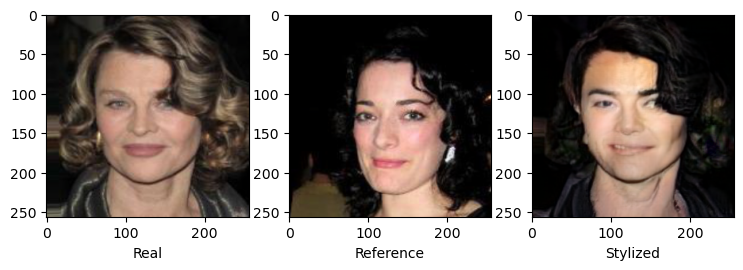

In [110]:
plt.figure(figsize=(12, 8))


def raw_to_plot(image):
    return denormalize(image.permute(1, 2, 0).detach().cpu().numpy())


ind = 4
plt.subplot(1, 4, 1)
plt.imshow(raw_to_plot(x_real[ind]))
plt.xlabel("Real")

plt.subplot(1, 4, 2)
plt.imshow(raw_to_plot(x_ref[ind]))
plt.xlabel("Reference")

plt.subplot(1, 4, 3)
plt.imshow(raw_to_plot(x_fake[ind]))
plt.xlabel("Stylized")

2) Generate style from latent code

In [ ]:
with torch.no_grad():
    z_trg = torch.randn((args.batch_size, args.latent_dim)).to(device)
    y_trg = torch.ones(8, dtype=int).to(device) * domain2index["Blond_Hair"]

    s_trg = nets.mapping_network(z_trg, y_trg)
    x_fake = nets.generator(x_real, s_trg)

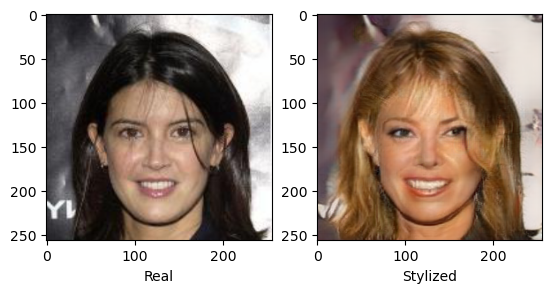

In [134]:
ind = 5
plt.subplot(1, 2, 1)
plt.imshow(raw_to_plot(x_real[ind]))
plt.xlabel("Real")

plt.subplot(1, 2, 2)
plt.imshow(raw_to_plot(x_fake[ind]))
plt.xlabel("Stylized")

### Examples

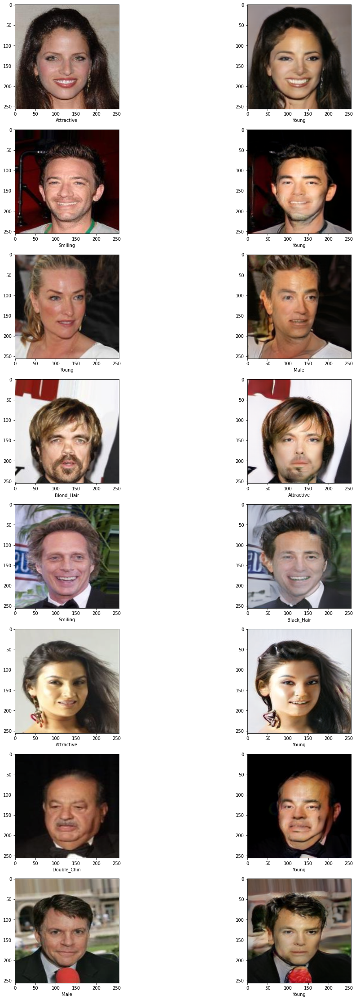

In [ ]:
num_images = args.batch_size
plt.figure(figsize=(17, num_images * 5))

for i in range(2 * args.batch_size):
    if i % 2 == 0:
        plt.subplot(num_images, 2, i + 1)
        plt.imshow(denormalize(x_source[i // 2].detach().cpu().permute(1, 2, 0)))
        plt.xlabel(source_labels[i // 2])
    else:
        plt.subplot(num_images, 2, i + 1)
        plt.imshow(denormalize(x_fake[i // 2].detach().cpu().permute(1, 2, 0)))
        plt.xlabel(reference_labels[i // 2])

### Multi-domain translation

Я использовал 10 доменов вместо 40 доступных для селебы.
Сгенерированные картинки удовлетворяют доменам, которые мы им присваиваем с разными степенями качества. Иногда есть явные артефакты, например в домене Wearing_Hat. В целом модель что-то понимает про домены, но реалистичность фотографий не самая выдающаяся, но я и не обучал до полной сходимости.

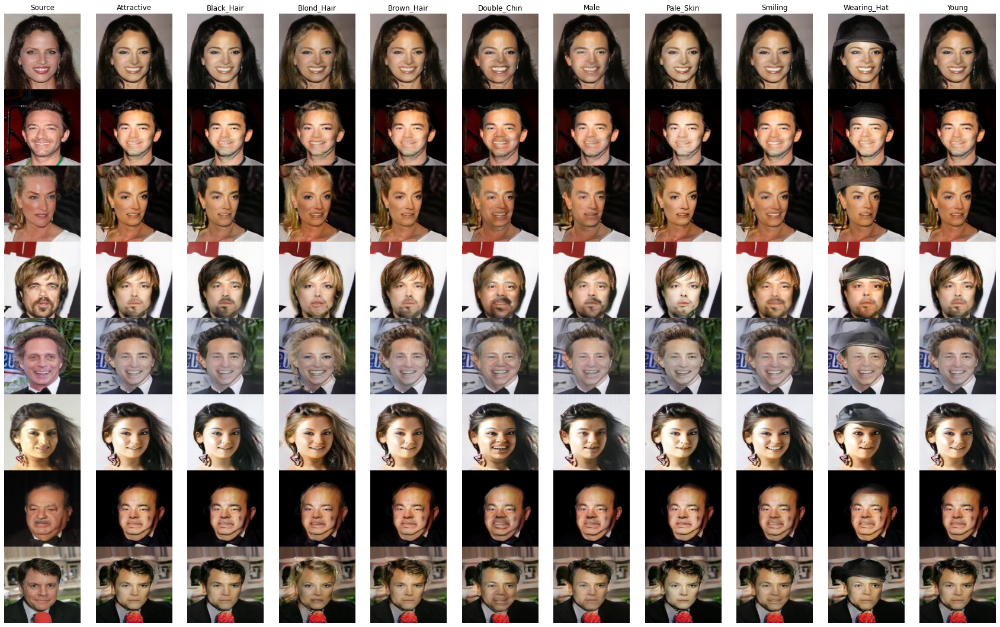

In [ ]:
num_images = 8
num_domains = 10

plt.figure(figsize=(30, num_domains * 5))

# Source image
x_cat = x_src.permute(0, 2, 3, 1).reshape(-1, x_cat.shape[1], x_cat.shape[-1])
plt.subplot(1, num_domains + 1, 1)
plt.imshow(denormalize(x_cat.detach().cpu()))
plt.axis("off")
plt.title("Source")

for dom_i in range(num_domains):
    domain_name = selected_attrs[dom_i]

    with torch.no_grad():
        y_target = torch.ones(num_images).long() * dom_i
        if domain_name == "Male":
            y_target = torch.tensor([0, 0, 1, 0, 0, 1, 0, 0])
        s_target = nets.style_encoder(x_src, y_target)
        x_stylized = nets.generator(x_src, s_target)

    x_cat = x_stylized.permute(0, 2, 3, 1)  # (batch_size, H, W, C)
    x_cat = x_cat.reshape(-1, x_cat.shape[1], x_cat.shape[-1])

    plt.subplot(1, num_domains + 1, dom_i + 2)
    plt.imshow(denormalize(x_cat.detach().cpu()))
    plt.axis("off")
    plt.title(domain_name)

  0%|          | 0/10 [00:00<?, ?it/s]

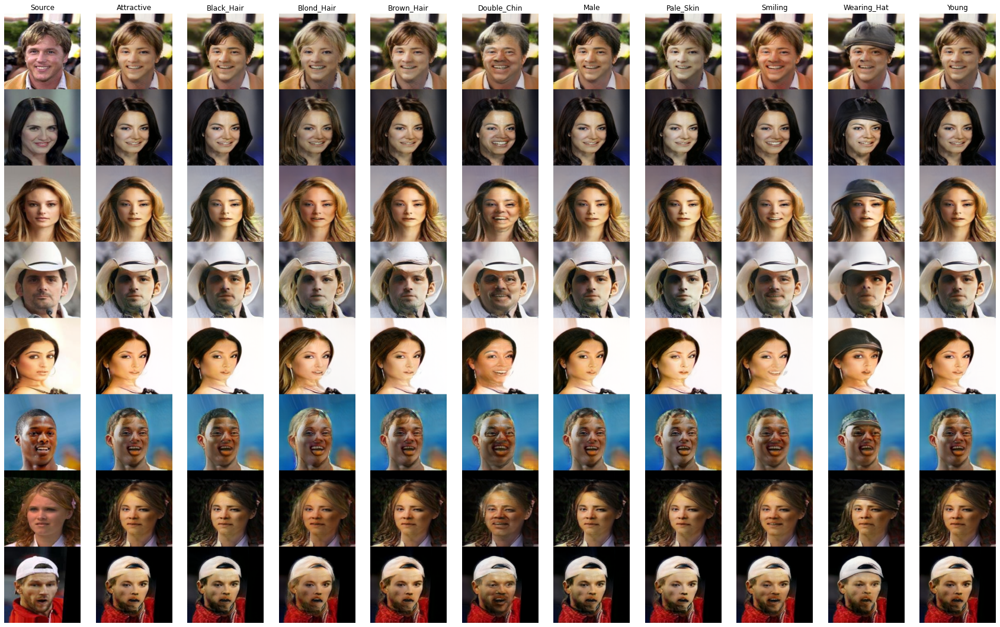

In [ ]:
num_images = 8
num_domains = 10

plt.figure(figsize=(30, num_domains * 5))

# Source image
x_cat = x_source.permute(0, 2, 3, 1)
x_cat = x_cat.reshape(-1, x_cat.shape[1], x_cat.shape[-1])
plt.subplot(1, num_domains + 1, 1)
plt.imshow(denormalize(x_cat.detach().cpu()))
plt.axis("off")
plt.title("Source")

for dom_i in trange(num_domains):
    domain_name = selected_attrs[dom_i]

    with torch.no_grad():
        y_target = torch.ones(num_images).long() * dom_i
        if domain_name == "Male":
            y_target = torch.tensor([1, 0, 0, 0, 1, 0, 1, 1])
        s_target = nets.style_encoder(x_source, y_target)
        x_stylized = nets.generator(x_source, s_target)

    x_cat = x_stylized.permute(0, 2, 3, 1)  # (batch_size, H, W, C)
    x_cat = x_cat.reshape(-1, x_cat.shape[1], x_cat.shape[-1])

    plt.subplot(1, num_domains + 1, dom_i + 2)
    plt.imshow(denormalize(x_cat.detach().cpu()))
    plt.axis("off")
    plt.title(domain_name)

### More examples

Также я загрузил фото своих друзей и применил к ним разные стили, чтобы проверить модель на out-of-sample.
Видно что реалистичность фотографий такая же как и для селебы, домены правильно переносятся. Но сгенерированные фотографии не близки к реальному фото, характеристики лиц не сохраняются, как-будто берется усредненное лицо селебы и уже к нему применяется стиль. Задний фон в отличие от селебы сильнее плывет.

In [ ]:
x_src = torch.cat((img1, img2, img3), dim=0)
x_src.shape

torch.Size([3, 3, 256, 256])

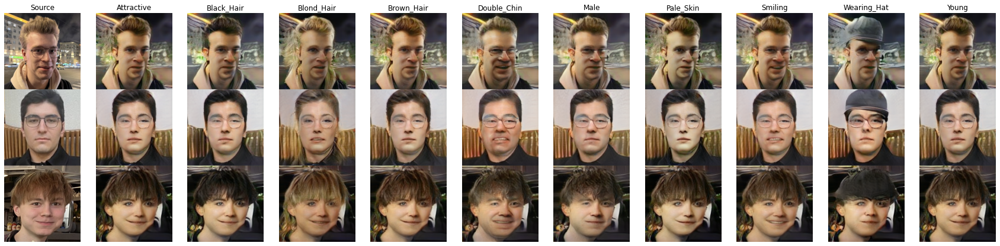

In [ ]:
num_images = 3
num_styles = 10

plt.figure(figsize=(30, num_styles * 5))

# Source image
x_cat = x_src.permute(0, 2, 3, 1).reshape(-1, x_cat.shape[1], x_cat.shape[-1])
plt.subplot(1, num_styles + 1, 1)
plt.imshow(denormalize(x_cat.detach().cpu()))
plt.axis("off")
plt.title("Source")

for style_i in range(num_styles):
    style_name = selected_attrs[style_i]

    with torch.no_grad():
        if style_name == "Male":
            style_i = 0
        y_target = torch.ones(num_images).long() * style_i
        s_target = nets.style_encoder(x_src, y_target)
        x_stylized = nets.generator(x_src, s_target)

    x_cat = x_stylized.permute(0, 2, 3, 1)  # (batch_size, H, W, C)
    x_cat = x_cat.reshape(-1, x_cat.shape[1], x_cat.shape[-1])

    plt.subplot(1, num_styles + 1, style_i + 2)
    plt.imshow(denormalize(x_cat.detach().cpu()))
    plt.axis("off")
    plt.title(style_name)

### Latent space

In [137]:
fetcher = InputFetcher(loader, loader_ref, args.latent_dim, device)
inputs = next(fetcher)
x_src, x_ref = inputs.x_src, inputs.x_ref
y_src, y_ref = inputs.y_src, inputs.y_ref
z_trg = inputs.z_trg

source_labels = [selected_attrs[index] for index in y_src.detach().cpu()]
reference_labels = [selected_attrs[index] for index in y_ref.detach().cpu()]

1) Посмотрим на латентное простарнство стилей, сгенерированных из шума:

In [ ]:
styles_space = []

for i in range(1000):
    with torch.no_grad():
        z_target = torch.randn(10, args.latent_dim)
        y_target = torch.tensor(range(10))
        style_trg = nets.mapping_network(z_target, y_target)
    styles_space.append(style_trg)

styles_space = torch.cat(styles_space)
styles_space.shape

torch.Size([10000, 64])

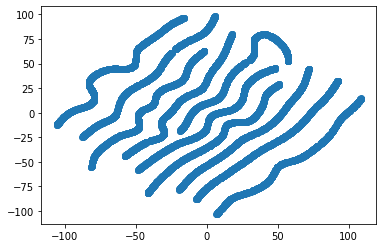

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

tsne = TSNE()

tsne_styles = tsne.fit_transform(styles_space)
plt.scatter(tsne_styles[:, 0], tsne_styles[:, 1])
plt.show()

Видно, что для каждого уникального домена есть кластер точек из стилей, сгенерированных из шума. \
Причем в пространстве стилей эти кластеры не пересекаются друг с другом

2) Посмотрим на пространство стилей, извлеченных из картинок датасета:

In [ ]:
styles_space2 = []

for i in range(10):
    inputs = next(fetcher)
    x_source = inputs.x_src

    for domain_j in range(10):
        with torch.no_grad():
            y_target = torch.ones(8).long() * domain_j
            s_target = nets.style_encoder(x_source, y_target)
        styles_space2.append(s_target)

styles_space2 = torch.cat(styles_space2)
styles_space2.shape

torch.Size([800, 64])

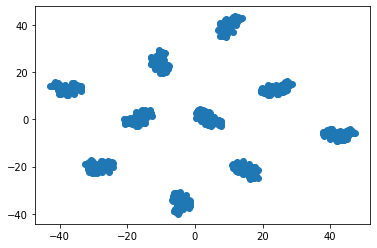

In [ ]:
tsne2 = TSNE()

tsne_styles2 = tsne2.fit_transform(styles_space2)
plt.scatter(tsne_styles2[:, 0], tsne_styles2[:, 1])
plt.show()

Видно, что опять для каждого домена есть кластер стилей из разных картинок датасета.